# Кластеризация
__Суммарное количество баллов: 10__

В этом домашнем задании предлагается реализовать три различных метода кластеризации, понять, в каких случаях стоит применять те или иные методы, а так же применить один из алгоритмов к задаче уменьшения цветности изображения.

In [14]:
from sklearn.neighbors import KDTree
from sklearn.datasets import make_blobs, make_moons
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib
import copy
import cv2
from collections import deque
from typing import NoReturn

In [15]:
def visualize_clasters(X, labels):
    unique_labels = np.unique(labels)
    unique_colors = np.random.random((len(unique_labels), 3))
    colors = [unique_colors[l] for l in labels]
    plt.figure(figsize=(9, 9))
    plt.scatter(X[:, 0], X[:, 1], c=colors)
    plt.show()

def clusters_statistics(flatten_image, cluster_colors, cluster_labels):
    fig, axes = plt.subplots(3, 2, figsize=(12, 16))
    for remove_color in range(3):
        axes_pair = axes[remove_color]
        first_color = 0 if remove_color != 0 else 2
        second_color = 1 if remove_color != 1 else 2
        axes_pair[0].scatter([p[first_color] for p in flatten_image], [p[second_color] for p in flatten_image], c=flatten_image, marker='.')
        axes_pair[1].scatter([p[first_color] for p in flatten_image], [p[second_color] for p in flatten_image], c=[cluster_colors[c] for c in cluster_labels], marker='.')
        for a in axes_pair:
            a.set_xlim(0, 1)
            a.set_ylim(0, 1)
    plt.show()

Генерируем два синтетических набора данных для кластеризации. Далее будем тестировать наши алгоритмы на них.

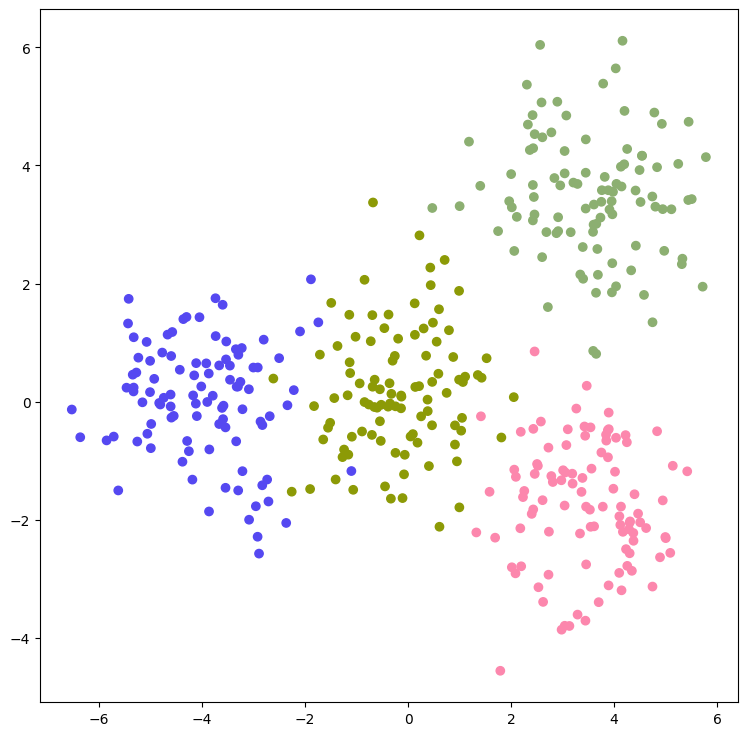

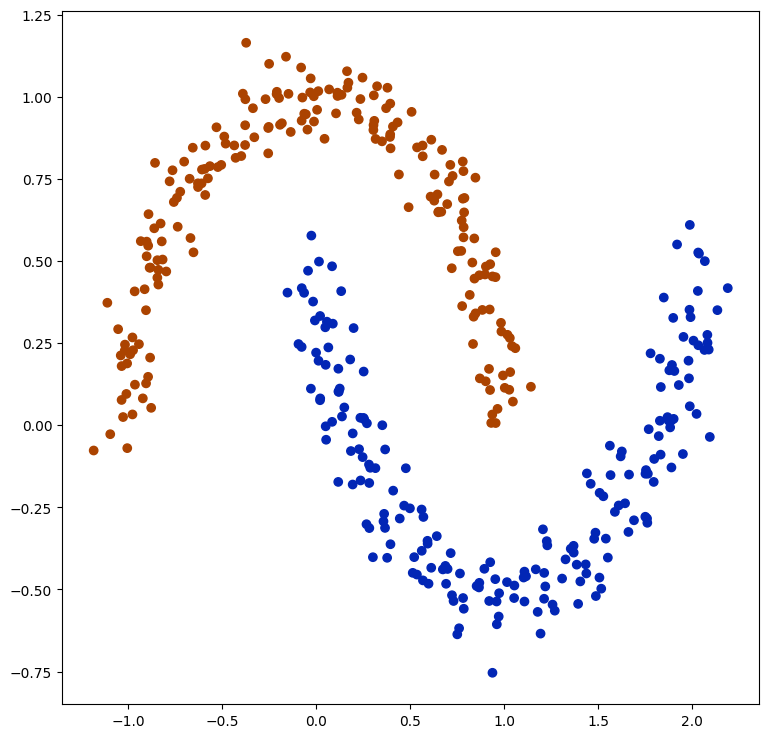

In [16]:
X_1, true_labels = make_blobs(400, 2, centers=[[0, 0], [-4, 0], [3.5, 3.5], [3.5, -2.0]])
visualize_clasters(X_1, true_labels)
X_2, true_labels = make_moons(400, noise=0.075)
visualize_clasters(X_2, true_labels)

### Задание 1 (3 балла)
Первый метод, который предлагается реализовать - метод K средних.

#### Описание методов
`fit(X, y=None)` ищет и запоминает в `self.centroids` центроиды кластеров для набора данных.
`predict(X)` для каждого элемента из `X` возвращает номер кластера, к которому относится данный элемент.

#### Инициализация кластеров
Есть несколько вариантов инициализации кластеров. Нужно реализовать их все:
1. `random` - центроиды кластеров являются случайными точками
2. `sample` - центроиды кластеров выбираются случайно из набора данных
3. `k-means++` - центроиды кластеров инициализируются при помощи метода K-means++

__Не забудте реинициализировать пустые кластеры!__

In [17]:
from sklearn.neighbors import KDTree
from sklearn.datasets import make_blobs, make_moons
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib
import copy
import cv2
from collections import deque
from typing import NoReturn

class KMeans:
    def __init__(self, n_clusters: int, init: str = "random",
                 max_iter: int = 300):
        """

        Parameters
        ----------
        n_clusters : int
            Число итоговых кластеров при кластеризации.
        init : str
            Способ инициализации кластеров. Один из трех вариантов:
            1. random --- центроиды кластеров являются случайными точками,
            2. sample --- центроиды кластеров выбираются случайно из  X,
            3. k-means++ --- центроиды кластеров инициализируются
                при помощи метода K-means++.
        max_iter : int
            Максимальное число итераций для kmeans.

        """

        self.n_clusters = n_clusters
        self.init = init
        self.max_iter = max_iter

    def fit(self, X: np.array, y = None) -> NoReturn:
        """
        Ищет и запоминает в self.centroids центроиды кластеров для X.

        Parameters
        ----------
        X : np.array
            Набор данных, который необходимо кластеризовать.
        y : Ignored
            Не используемый параметр, аналогично sklearn
            (в sklearn считается, что все функции fit обязаны принимать
            параметры X и y, даже если y не используется).

        """
        dim = X.shape[1]
        n = X.shape[0]
        if self.init == 'random':
          self.centroids = [[-1 for _ in range(dim)] for _ in range(self.n_clusters)]
          for q in range(self.n_clusters):
            for i in range(dim):
              self.centroids[q][i] = random.uniform(X[:, i].min(), X[:, i].max())
        elif self.init == 'sample':
          self.centroids = [random.choice(X) for _ in range(self.n_clusters)]
        elif self.init == 'k-means++':
          self.centroids = [random.choice(X)]
          while len(self.centroids) != self.n_clusters:
            current = 0
            dist_sqrt_accum = []
            for idx, point in enumerate(X):
              dist_to_centroid = min([np.linalg.norm(center - point) for center in self.centroids])
              current += (dist_to_centroid ** 2)
              dist_sqrt_accum.append(current)
            random_point = random.randint(0, int(dist_sqrt_accum[-1]))
            left, right = -1, n
            while right - left > 1:
                mid = (left + right) // 2
                if dist_sqrt_accum[mid] > random_point:
                    right = mid
                else:
                    left = mid
            self.centroids.append(X[right])

    def predict(self, X: np.array) -> np.array:
        """
        Для каждого элемента из X возвращает номер кластера,
        к которому относится данный элемент.

        Parameters
        ----------
        X : np.array
            Набор данных, для элементов которого находятся ближайшие кластера.

        Return
        ------
        labels : np.array
            Вектор индексов ближайших кластеров
            (по одному индексу для каждого элемента из X).

        """

        dim = X.shape[1]
        n = X.shape[0]

        labels = [-1 for _ in range(n)]
        centers = copy.deepcopy(self.centroids)

        it = 0
        while it < self.max_iter - 1:
          points_in_centroid = [[] for _ in range(self.n_clusters)]
          for idx, point in enumerate(X):
            label = np.argmin([np.linalg.norm(center - point) for center in centers])
            points_in_centroid[label].append(point)
            labels[idx] = label
          if it == 0:
            flag = False
            for idx, el in enumerate(points_in_centroid):
              if not el:
                flag = True

                if self.init == 'random':
                  for i in range(dim):
                    centers[idx][i] = random.uniform(X[:, i].min(), X[:, i].max())
                elif self.init == 'sample':
                  centers[idx] = random.choice(X)
                elif self.init == 'k-means++':
                  centers = list(np.delete(centers, idx, 0))
                  while len(centers) < self.n_clusters:
                    current = 0
                    dist_sqrt_accum = []
                    for idx, point in enumerate(X):
                      dist_to_centroid = min([np.linalg.norm(center - point) for center in centers])
                      current += (dist_to_centroid ** 2)
                      dist_sqrt_accum.append(current)

                    random_point = random.randint(0, int(dist_sqrt_accum[-1]))
                    left, right = -1, n
                    while right - left > 1:
                      mid = (left + right) // 2
                      if dist_sqrt_accum[mid] > random_point:
                        right = mid
                      else:
                        left = mid
                    centers.append(X[right])
            if flag:
              continue

          centers = [np.mean(points, axis=0) for points in points_in_centroid]
          it += 1
        return np.array(labels)










Протестируйте алгоритм на синтетических данных. При необходимости подберите гиперпараметры для достижения лучшего качества кластеризации.

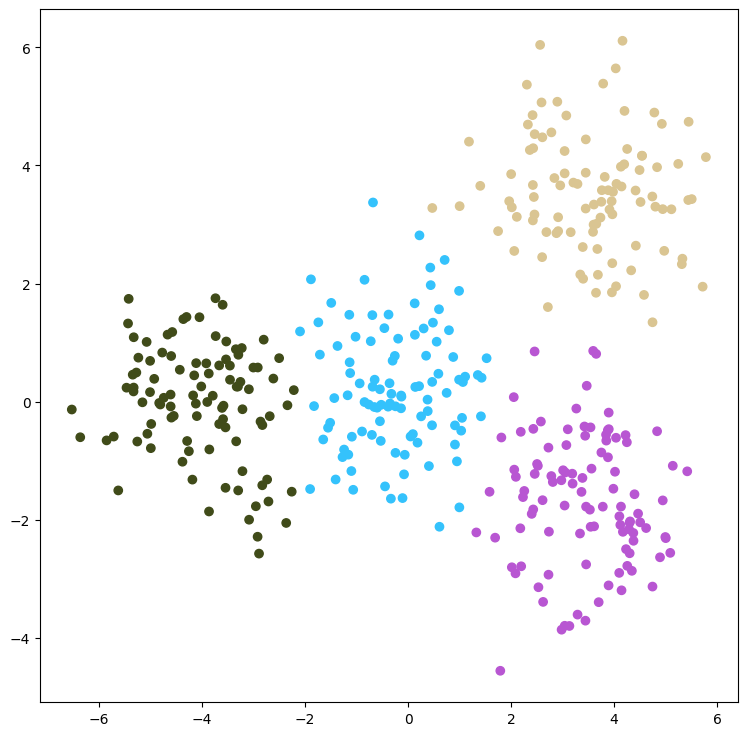

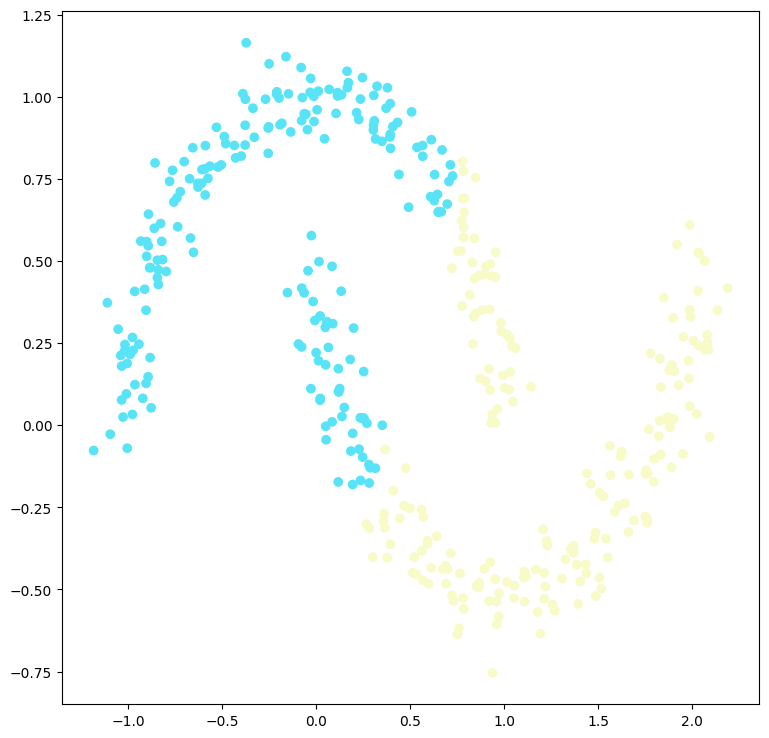

In [18]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(X_1)
labels = kmeans.predict(X_1)
visualize_clasters(X_1, labels)

kmeans = KMeans(n_clusters=2)
kmeans.fit(X_2)
labels = kmeans.predict(X_2)
visualize_clasters(X_2, labels)

### Задание 2 (3 балла)
В отличии от K-means, DBScan не позволяет задать количество кластеров, на которое будут разбиты данные. Руководствуясь геометрической интерпретацией, он позволяет выделять кластеры более сложной формы.

#### Описание методов
`fit_predict(X, y=None)` для каждого элемента `X` возвращает метку кластера, к которому он относится.

#### Возможные метрики
* `euclidean`
* `manhattan`
* `chebyshev`

__Для быстрого поиска соседей используйте `sklearn.neighbors.KDTree`__

In [19]:
class DBScan:
    def __init__(self, eps: float = 0.5, min_samples: int = 5,
                 leaf_size: int = 40, metric: str = "euclidean"):
        """

        Parameters
        ----------
        eps : float, min_samples : int
            Параметры для определения core samples.
            Core samples --- элементы, у которых в eps-окрестности есть
            хотя бы min_samples других точек.
        metric : str
            Метрика, используемая для вычисления расстояния между двумя точками.
            Один из трех вариантов:
            1. euclidean
            2. manhattan
            3. chebyshev
        leaf_size : int
            Минимальный размер листа для KDTree.

        """
        self.eps = eps
        self.min_samples = min_samples
        self.leaf_size = leaf_size
        self.metric = metric
    def dfs(self, adj, v, labels, color, used):
      used[v] = True

      for u in adj[v]:
        if labels[u] == -1:
          labels[u] = color
        if not used[u] and len(adj[u]) >= self.min_samples:
          self.dfs(adj, u, labels, color, used)


    def fit_predict(self, X: np.array, y = None) -> np.array:
        """
        Кластеризует элементы из X,
        для каждого возвращает индекс соотв. кластера.
        Parameters
        ----------
        X : np.array
            Набор данных, который необходимо кластеризовать.
        y : Ignored
            Не используемый параметр, аналогично sklearn
            (в sklearn считается, что все функции fit_predict обязаны принимать
            параметры X и y, даже если y не используется).
        Return
        ------
        labels : np.array
            Вектор индексов кластеров
            (Для каждой точки из X индекс соотв. кластера).

        """
        n = X.shape[0]
        tree = KDTree(X, metric = self.metric, leaf_size = self.leaf_size)
        neighbours = tree.query_radius(X, r = self.eps)
        labels = [-1 for _ in range(n)]
        used = [False for _ in range(n)]
        color = 0

        for i in range(n):
          if not used[i] and len(neighbours[i]) >= self.min_samples:
            labels[i] = color
            self.dfs(neighbours, i, labels, color, used)
            color += 1

        return labels



Протестируйте алгоритм на синтетических данных. При необходимости подберите гиперпараметры для достижения лучшего качества кластеризации.

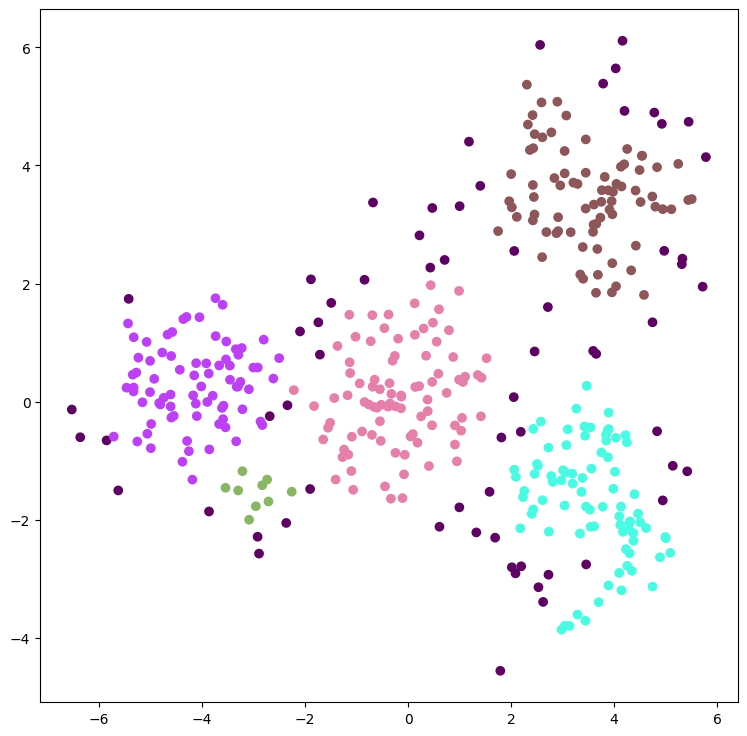

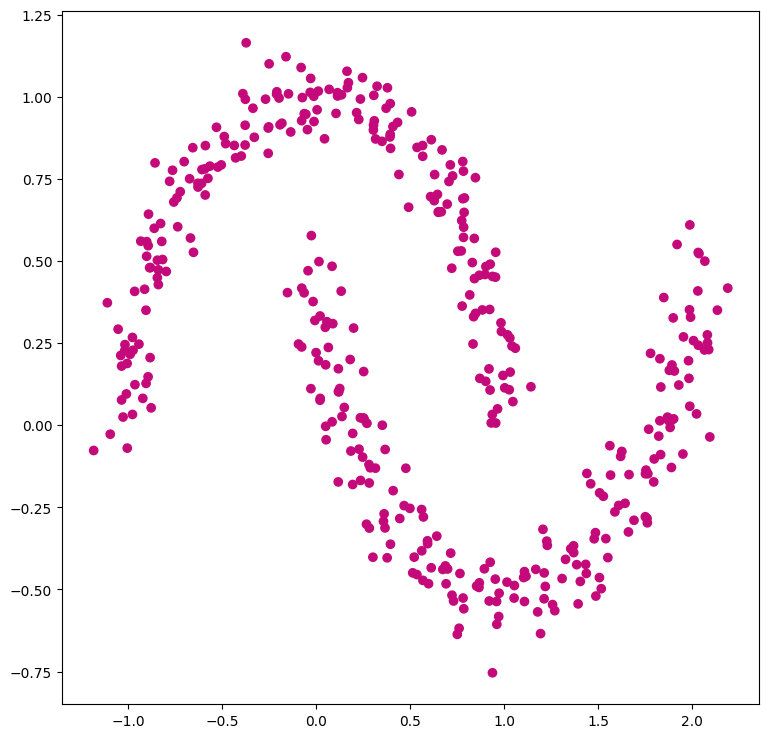

In [20]:
dbscan = DBScan()
labels = dbscan.fit_predict(X_1)
visualize_clasters(X_1, labels)

dbscan = DBScan()
labels = dbscan.fit_predict(X_2)
visualize_clasters(X_2, labels)

### Задание 3 (4 балла)
Идея AgglomerativeClustering заключается в том, чтобы итеративно объединять кластеры с наименьшим расстоянием между ними. Данный метод обладает высокой вычислительной сложностью, поэтому применим только для относительно небольших наборов данных.

#### Описание методов
`fit_predict(X, y=None)` для каждого элемента `X` возвращает метку кластера, к которому он относится.

#### Linkage-функции
__Linkage__ - это способ, которым будет рассчитываться расстояние между кластерами. Предлагается реализовать три варианта такой функции:
1. `average` - расстояние рассчитывается как среднее расстояние между всеми парами точек, где одна принадлежит первому кластеру, а другая - второму.
2. `single` - расстояние рассчитывается как минимальное из расстояний между всеми парами точек, где одна принадлежит первому кластеру, а другая - второму.
2. `complete` - расстояние рассчитывается как максимальное из расстояний между всеми парами точек, где одна принадлежит первому кластеру, а другая - второму.

In [41]:
class AgglomerativeClustering:
    def __init__(self, n_clusters: int = 16, linkage: str = "average"):
        """

        Parameters
        ----------
        n_clusters : int
            Количество кластеров, которые необходимо найти (то есть, кластеры
            итеративно объединяются, пока их не станет n_clusters)
        linkage : str
            Способ для расчета расстояния между кластерами. Один из 3 вариантов:
            1. average --- среднее расстояние между всеми парами точек,
               где одна принадлежит первому кластеру, а другая - второму.
            2. single --- минимальное из расстояний между всеми парами точек,
               где одна принадлежит первому кластеру, а другая - второму.
            3. complete --- максимальное из расстояний между всеми парами точек,
               где одна принадлежит первому кластеру, а другая - второму.
        """
        self.n_clusters = n_clusters
        self.linkage = linkage

    def get_matrix_dist(self, X):

        n = X.shape[0]
        matrix_dist = [[np.inf for _ in range(n)] for _ in range(n)]

        for i in range(n):
            for j in range(i + 1, n):
                distance = np.linalg.norm(X[i] - X[j])
                matrix_dist[i][j] = distance
                matrix_dist[j][i] = distance

        return np.array(matrix_dist)

    def upload_matrix_dist(self, matrix_dist, points_in_claster, i_min, j_min):

        for i in range(matrix_dist.shape[0]):
            if i == i_min:
                matrix_dist[i][i_min] = np.inf
                continue

            elif self.linkage == 'average':
                new_dist = (len(points_in_claster[i_min]) * matrix_dist[i][i_min] + len(points_in_claster[j_min]) *
                            matrix_dist[i][j_min]) / (
                                   len(points_in_claster[i_min]) + len(points_in_claster[j_min]))

            elif self.linkage == 'single':
                new_dist = min(matrix_dist[i][i_min], matrix_dist[i][j_min])

            elif self.linkage == 'complete':
                new_dist = max(matrix_dist[i][i_min], matrix_dist[i][j_min])

            matrix_dist[i][i_min] = new_dist
            matrix_dist[i_min][i] = new_dist

        return matrix_dist

    def fit_predict(self, X: np.array, y=None) -> np.array:
        """
        Кластеризует элементы из X,
        для каждого возвращает индекс соотв. кластера.
        Parameters
        ----------
        X : np.array
            Набор данных, который необходимо кластеризовать.
        y : Ignored
            Не используемый параметр, аналогично sklearn
            (в sklearn считается, что все функции fit_predict обязаны принимать
            параметры X и y, даже если y не используется).
        Return
        ------
        labels : np.array
            Вектор индексов кластеров
            (Для каждой точки из X индекс соотв. кластера).
        """

        k = X.shape[0]
        matrix_dist = self.get_matrix_dist(X)
        labels = [i for i in range(k)]
        count = [1 for _ in range(k)]
        points_in_claster = [[i] for i in range(k)]

        while k > self.n_clusters:
            i_min, j_min = np.where(matrix_dist == matrix_dist.min())
            matrix_dist = self.upload_matrix_dist(matrix_dist, points_in_claster, i_min[0], j_min[0])
            matrix_dist = np.delete(matrix_dist, j_min[0], 0)
            matrix_dist = np.delete(matrix_dist, j_min[0], 1)

            points_in_claster[i_min[0]] += points_in_claster[j_min[0]]
            points_in_claster.pop(j_min[0])

            for i in range(1, len(points_in_claster[i_min[0]])):
                el = points_in_claster[i_min[0]][i]
                labels[el] = labels[points_in_claster[i_min[0]][0]]

            k -= 1

        return np.array(labels)




Протестируйте алгоритм на синтетических данных. При необходимости подберите гиперпараметры для достижения лучшего качества кластеризации.

In [ ]:
agg_clustering = AgglomerativeClustering(n_clusters=4)
labels = agg_clustering.fit_predict(X_1)
visualize_clasters(X_1, labels)

agg_clustering = AgglomerativeClustering(n_clusters=2)
labels = agg_clustering.fit_predict(X_2)
visualize_clasters(X_2, labels)

### Дополнительно
Научимся кластеризовать цвета в изображении. Для начала используем OpenCV для того, чтобы считать изображение.

#### Описание методов
`read_image(path)` читает изображение и возвращает его в виде трехмерного numpy массива размера `(N, M, C)`, где `N` и `M` - размеры изображения, а `C` - количество цветов (3 для обычного изображения)
`save_image(image, path)` сохраняет изображение.

__Учтите, что `cv2.imread` считывает изображение в цветовой схеме BGR. После считывания необходимо перевести его в RGB и нормализовать__

In [3]:
def read_image(path: str) -> np.array:
    """
    Читает изображение.

    Parameters
    ----------
    path : str
        Путь к изображению.

    Return
    ------
    image : np.array
        Трехмерный массив размера (N, M, C),
        где N и M - размеры изображения,
        а C - количество цветов (3 для обычного изображения).
    """
    image = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB) / 255.
    return image

def show_image(image: np.array) -> NoReturn:
    """
    Выводит изображение

    Parameters
    ----------
    image : np.array
        Трехмерный массив - нормализованное изображение в цветовой схеме RGB.
    """
    plt.figure(figsize=np.array(image.shape[:-1]) / 50)
    plt.imshow(image)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def save_image(image: np.array, path: str) -> NoReturn:
    """
    Сохраняет изображение.

    Parameters
    ----------
    image : np.array
        Трехмерный массив - нормализованное изображение в цветовой схеме RGB.
    path : str
        Путь для сохранения.
    """
    image = cv2.cvtColor(np.float32(image * 255), cv2.COLOR_RGB2BGR)
    cv2.imwrite(path, image)

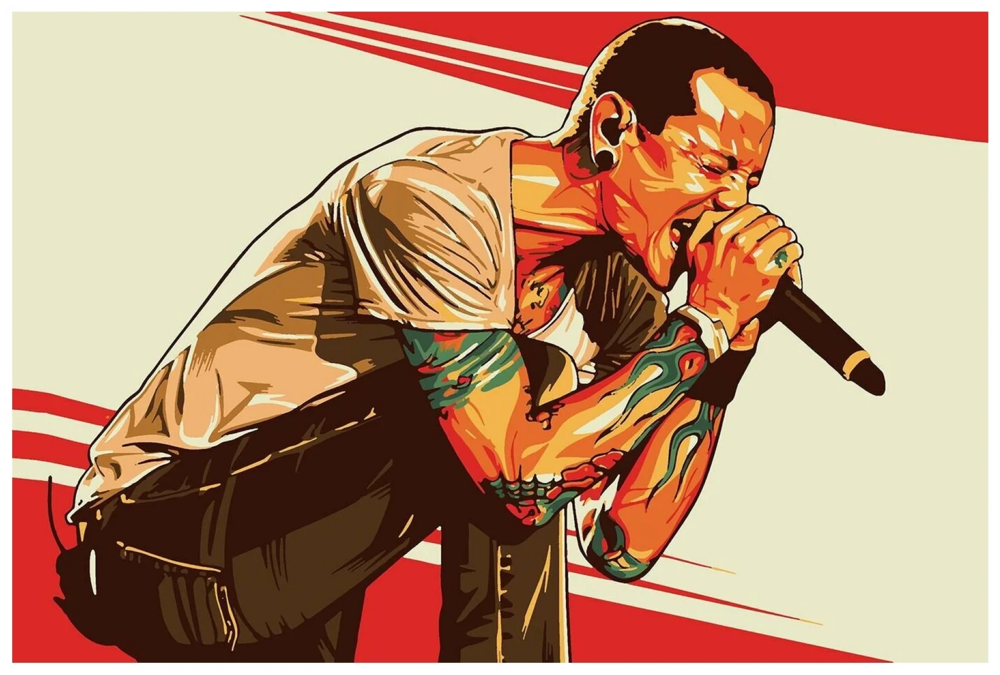

In [26]:
show_image(read_image("chester.png"))

Теперь реализуем функцию, которая будет кластеризовать цвета изображения одним из реализованных алгоритмов. Интерфейс этой функции можно менять. Функция должна возвращать новое изображение, в котором цвета заменены на цвета кластеров.

Затем применим ее к цветам изображения.

__Примечание: это задание проще всего выполнить при помощи KMeans__

In [22]:
def clusterize_image(image, n_clusters=8, color_scheme="rgb", show_cluster_statisitcs = False):
    orig_image = image
    if color_scheme == "hsv":
        image = cv2.cvtColor((image * 255).astype('float32'), cv2.COLOR_RGB2HSV)
        image /= 255.
    shape = image.shape

    small = image[::4,::4,:]
    image = image.reshape((-1, shape[-1]))
    orig_image = orig_image.reshape((-1, shape[-1]))
    X = small.reshape((-1, shape[-1]))
    kmeans = KMeans(max_iter=16, n_clusters=n_clusters, init="k-means++")
    kmeans.fit(X)
    clusters = kmeans.predict(image)
    cluster_colors = kmeans.centroids

    recolored = np.array([cluster_colors[c] for c in clusters]).reshape(shape)
    if color_scheme == "hsv":
        recolored *= 255
        recolored = cv2.cvtColor(recolored.astype('float32'), cv2.COLOR_HSV2RGB) / 255.
    if show_cluster_statisitcs:
        clusters_statistics(orig_image, cluster_colors, clusters)
    return recolored.reshape(shape)

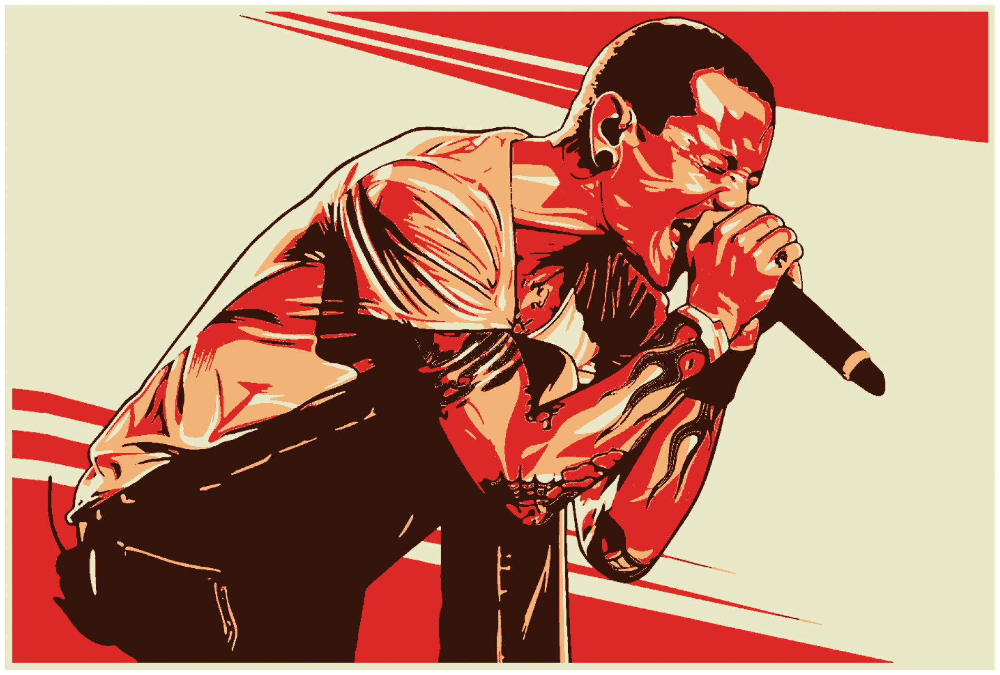

In [23]:
image = read_image("chester.png")
result = clusterize_image(image, n_clusters=4)
show_image(result)

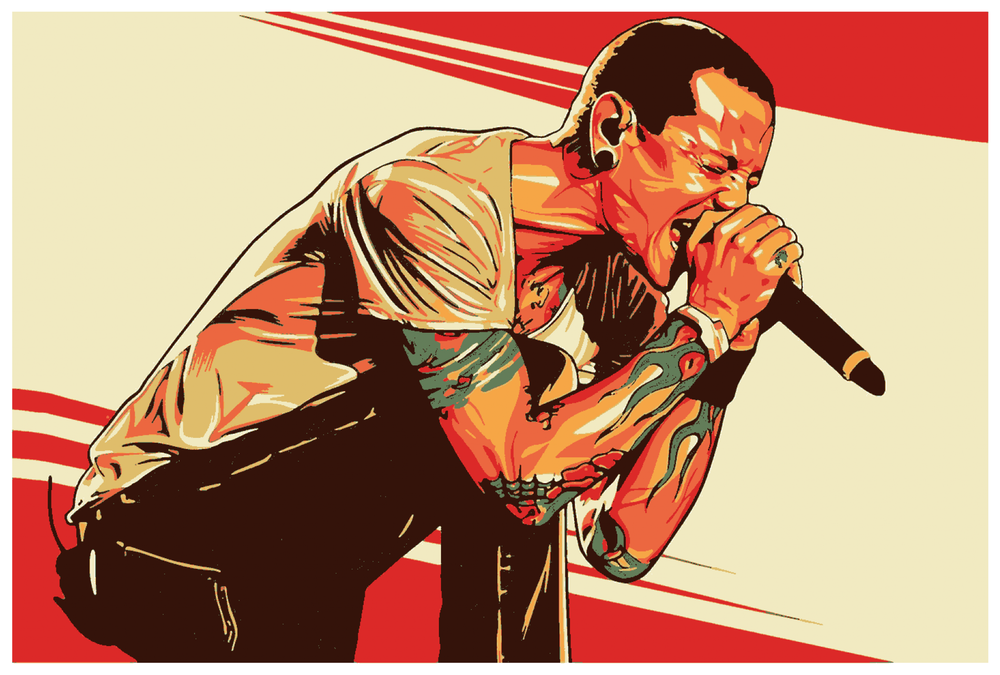

In [24]:
image = read_image("chester.png")
result = clusterize_image(image, n_clusters=8)
show_image(result)

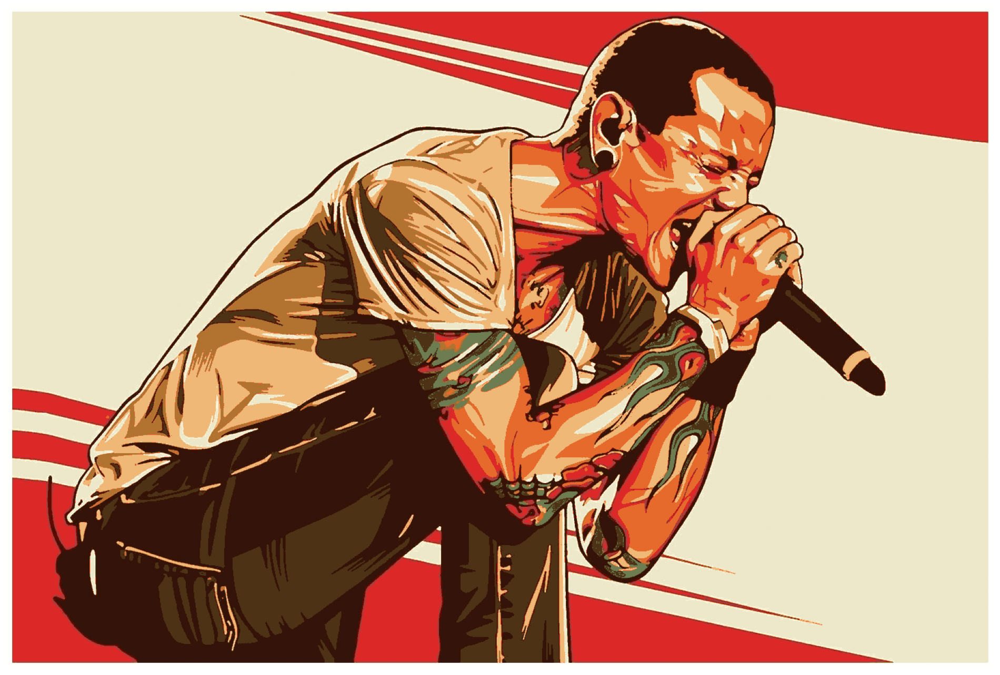

In [25]:
image = read_image("chester.png")
result = clusterize_image(image, n_clusters=16)
show_image(result)